# Gemetrical Reconstruction Exercise
### Drawing a free-kick circle into a 2D image

This notebook presents my solution to a task from a course I took at my university. 

We were given a [set of images with labeled points-of-interests](#sample_img) in world-coordinates. Our task was to project these coordinates to camera-coordinates and reproject them back to solve the camera calibration with a least-squares algorithm. After [calibrating the intrinsic parameters](#intrinsic_calibration) we were supposed to [draw the free-kick](#freekick) circle with a radius of 75 cm in a given set of images.

In [1]:
import math
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.optimize import least_squares
from scipy.spatial.transform import Rotation
import keras # we use keras only for some auxiliary functions
plt.rcParams['figure.figsize'] = 27, 27 


Using TensorFlow backend.


In [2]:
plt.rcParams['figure.figsize'] = 27, 27 # I needed this twice to make it work, strange!

In [3]:
# Download the robocup-freistoss.zip dataset and unzip it
# Alternative: Set data_root if the dataset is already downloaded.
import csv
import os
import glob
data_root = keras.utils.get_file('robocup-freistoss.zip','http://www.informatik.uni-bremen.de/agebv2/pub/robocup-freistoss.zip', extract=True)
data_root = os.path.join(os.path.split(data_root)[0],"robocup-freistoss")
#data_root = "/root/.keras/datasets/robocup-freistoss" # Use this instead if the dataset is on your system
print(f"Loaded {len(glob.glob(os.path.join(data_root,'*.*')))} files into {data_root}")

Loaded 106 files into /home/covis/.keras/datasets/robocup-freistoss


In [4]:
# Helper functions for handling the dataset
def toFloatOrNone (s):
    """Converts s to float or returns None if that fails"""
    try:
        val = float(s)
        return val
    except (ValueError, TypeError):
        return None
    
def loadImage(fname, color_mode='rgb'):
  "Loads an image as a h*w*3 numpy array."
  return np.asarray(Image.open(os.path.join(data_root,fname)))
    
def loadAnnotation (filename):
    """Reads annotated points from one of the csv files provided by the robocup-freistoss dataset.
       The returned data is a dict of dicts of a pair of a 2D and 3D tuple, such that

       dataset[image][pointname] = ((xImage, yImage), (xF, yF, zF))
       
       indicates that in the image filename there is a point called pointname and this point has 3D
       field coordinates (xF, yF, zF) and 2D image coordinates (xImage, yImage). Consider feld.pdf
       for the meaning of the point names and coordinate system.
    """
    with open(os.path.join(data_root,filename), newline='') as csvfile:
      reader = csv.DictReader(csvfile)
      data = dict()
      for row in reader:
         name = row['name']
         fname = row['image']
         xI=toFloatOrNone(row['x'])
         yI=toFloatOrNone(row['y'])
         xF=toFloatOrNone(row['xF'])
         yF=toFloatOrNone(row['yF'])
         zF=toFloatOrNone(row['zF'])
         if xI and yI:
           if not fname in data: data[fname] = dict()
           data[fname][name] = ((xI, yI), (xF, yF, zF))
    return data

def pointsAsArray (dataOfImage):
    """Converts the data of one image (i.e. dataset[image]) into a 2-dimensional float tensor, where the
       first dimension is the multitude of points and the second is (xI, yI, xF, yF, zF)."""
    return np.array([[data[0][0], data[0][1], data[1][0], data[1][1], data[1][2]] for data in dataOfImage.values()], dtype='float')

def indexOf (name, dataOfImage):
    """Returns which index 'name' has in the array returned by pointsAsArray(dataOfImage)."""
    for i, nm in enumerate(dataOfImage.keys()): 
        if nm==name: return i
    return None
    
def showImageAnnotation(filename, groundTruth=None, prediction=None, circle=None, save=None):
  """Shows an image together with up to two set of annotated points (groundTruth and prediction).
  If both are given they are connected by arrows. If circle is given is it also drawn as a squence
  of cyclically connected points. If save is given, the resulted is saved in save. """
  image = loadImage(filename)
  plt.imshow(image, aspect='equal', interpolation=None)
  if not(groundTruth is None):  
    x = [label[1][0][0] for label in groundTruth.items()]
    y = [label[1][0][1] for label in groundTruth.items()]
    plt.scatter (x, y, marker="x", c="b")
    for label in groundTruth.items():
       plt.annotate (label[0], label[1][0], fontsize=25)
  if not(prediction is None):
    x = prediction[:,0]
    y = prediction[:,1]
    plt.scatter (x, y, marker="x", c="b")
  if not(groundTruth is None) and not(prediction is None):
    for i, label in enumerate(groundTruth.items()):
        x = label[1][0][0]
        y = label[1][0][1]
        plt.arrow(x, y, prediction[i][0]-x, prediction[i][1]-y, width=0.01)
  if not(circle is None):
    C = np.append(np.array(circle), [circle[0]], axis=0)
    plt.plot(C[:,0], C[:,1], color='r', linewidth=2)
  if save: plt.savefig(save)
  plt.show()

def nrOfPoints (dataset):
    """Counts the number of points in dataset"""
    return sum([len(val) for val in dataset.values()])

def costToRms (cost, nPoints, noiseImage):
    """Returns the rms pixel-error when the least-squares optimization reports 'cost'
    and there a nPoints 2D-points in the measurements and an image noise of noiseImage is assumed."""
    return math.sqrt(2*cost/nPoints)*noiseImage

# Load the datasets and show some statistics
calibrationData = loadAnnotation ('points-calibration.csv')
freistossData = loadAnnotation ('points-freistoss.csv')
imageFormat = loadImage(next(iter(calibrationData))).shape
nrOfCalibrationPoints = nrOfPoints(calibrationData)
print(f"{len(calibrationData)} images, {nrOfCalibrationPoints} points in the calibration dataset")
print(f"{len(freistossData)} images, {nrOfPoints(freistossData)} points in the freistoss dataset")

58 images, 547 points in the calibration dataset
42 images, 452 points in the freistoss dataset


## Load and show a random image with annotation <a id="sample_img"></a>

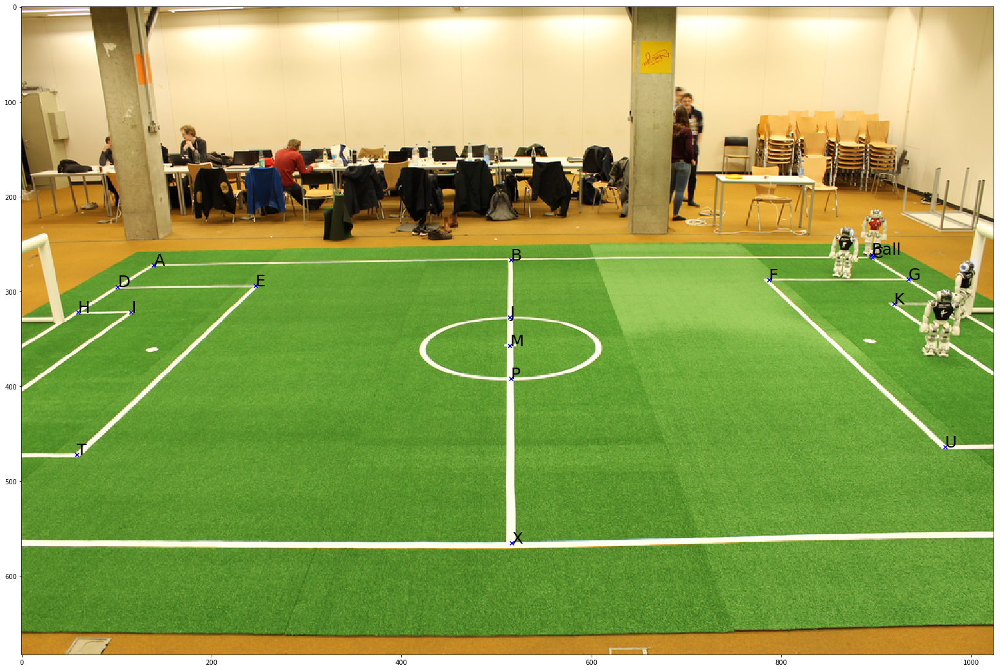

[[ 1.39e+02  2.72e+02 -4.50e+00  3.00e+00  0.00e+00]
 [ 5.15e+02  2.67e+02  0.00e+00  3.00e+00  0.00e+00]
 [ 8.96e+02  2.64e+02  4.50e+00  3.00e+00  0.00e+00]
 [ 1.01e+02  2.95e+02 -4.50e+00  2.00e+00  0.00e+00]
 [ 2.46e+02  2.94e+02 -2.85e+00  2.00e+00  0.00e+00]
 [ 7.87e+02  2.88e+02  2.85e+00  2.00e+00  0.00e+00]
 [ 9.34e+02  2.87e+02  4.50e+00  2.00e+00  0.00e+00]
 [ 5.90e+01  3.22e+02 -4.50e+00  1.10e+00  0.00e+00]
 [ 1.15e+02  3.22e+02 -3.90e+00  1.10e+00  0.00e+00]
 [ 5.14e+02  3.27e+02  0.00e+00  7.50e-01  0.00e+00]
 [ 9.19e+02  3.13e+02  3.90e+00  1.10e+00  0.00e+00]
 [ 5.14e+02  3.57e+02  0.00e+00  0.00e+00  0.00e+00]
 [ 5.15e+02  3.92e+02  0.00e+00 -7.50e-01  0.00e+00]
 [ 5.80e+01  4.72e+02 -2.85e+00 -2.00e+00  0.00e+00]
 [ 9.73e+02  4.64e+02  2.85e+00 -2.00e+00  0.00e+00]
 [ 5.16e+02  5.65e+02  0.00e+00 -3.00e+00  0.00e+00]
 [ 8.95e+02  2.61e+02       nan       nan  5.00e-02]]


In [5]:
# Load and show a random image with annotation
fname = random.choice(list(freistossData.keys()))
showImageAnnotation (fname, freistossData[fname])
print(pointsAsArray(freistossData[fname]))


In [6]:
# Core camera model from the camera-calibration example and auxialiary functions for
# working with coordinate transforms
def project (pInX, camInX, f, u0, v0, k1, k2):
    """Implements the camera model also used in OpenCV limited to one coefficient of radial distortion.
    If a point is at pInX (4 vector, 3 vector also supported) in some coordinate system X and the camera 
    is at camInX in the same system (pose, 4*4 matrix)
    and the camera has focal length f, image center u0, v0 and radial distortion k1, then the point will be seen
    in the image at the returned 2D position. If a point is behind the camera
    NaN is returned. This function works only for a single point and does not support broadcasting."""
    XInCam = np.linalg.inv(camInX)
    if len(pInX)==3: 
        pInC = XInCam @ np.append(pInX, 1)
    else: 
        pInC = XInCam @ pInX
    if pInC[2]<=0: return (math.nan, math.nan)
    xSlash = pInC[0]/pInC[2]
    ySlash = pInC[1]/pInC[2]
    r2 = xSlash**2 + ySlash**2
    xSSlash = xSlash * (1+k1*r2 + k2*r2**2) 
    ySSlash = ySlash * (1+k1*r2 + k2*r2**2)
    u = f*xSSlash + u0
    v = f*ySSlash + v0
    return (u,v)

def translation(tVec):
    """Returns a translation by tVec as a 4*4-transformation matrix. If the returned transformation is AinB,
    then A's origin is at tVec in B coordinates and X/Y/Z-axis point in the same direction."""
    return np.array([[1, 0, 0, tVec[0]],
                     [0, 1, 0, tVec[1]],
                     [0, 0, 1, tVec[2]],
                     [0, 0, 0, 1]])

def rotationX(angle):
    """Returns a rotation around the X-axis as a 4*4-transformation matrix. If the returned transformation is AinB,
    then both origin and X-axis coincide and A's Y and Z axis are rotated by angle around X relativ to B's axes."""
    c = math.cos(angle)
    s = math.sin(angle)
    return np.array([[1, 0, 0, 0],
                     [0, c, -s, 0],
                     [0, s,  c, 0],
                     [0, 0,  0, 1]])

def rotationY(angle):
    """Returns a rotation around the Y-axis as a 4*4-transformation matrix. If the returned transformation is AinB,
    then both origin and Y-axis coincide and A's Z and X axis are rotated by angle around Y relativ to B's axes."""
    c = math.cos(angle)
    s = math.sin(angle)
    return np.array([[ c, 0, -s, 0],
                     [ 0, 1, 0, 0],
                     [ s, 0,  c, 0],
                     [ 0, 0,  0, 1]])

def rotationZ(angle):
    """Returns a rotation around the Z-axis as a 4*4-transformation matrix. If the returned transformation is AinB,
    then both origin and Z-axis coincide and A's X and Y axis are rotated by angle around X relativ to B's axes."""
    c = math.cos(angle)
    s = math.sin(angle)
    return np.array([[c, -s, 0, 0],
                     [s,  c,  0, 0],
                     [0,  0,  1, 0],
                     [0,  0,  0, 1]])


def RTVectorToTransform (rtVec):
    """Converts a 6D vector, where rtVec[0:3] parametrizes rotation and rtVec[3:6] parametrizes translation 
    into a 4*4 transformation matrix. For this it uses the Rodriguez formula."""
    Trans = np.eye(4)
    Trans[0:3,0:3] = Rotation.from_rotvec(rtVec[0:3]).as_matrix()
    Trans[0:3,3] = rtVec[3:6]
    return Trans

## Intrinsic camera calibration <a id="intrinsic_calibration"></a>

In [7]:
# Measurement model for a single point and single image

# Explain the static (for all images) parameters and given an initial guess
"""
The static parameters include the two distortion coefficients as well as the corrections of the initial guess for
the translation of the tripod and the angle of the rotation around the z-axis. Since the distortion is camera specific
and the translation and roll of the tripod doesn't change in the given setting these parameters are static
"""
dofXStat = 6
kappa_1 = 0 # distortion coefficient #1
kappa_2 = 0 # distortion coefficient #2
t0_x_pos = 0 # Correction for the initial guess of the translation of the tripod on the x-axis
t0_y_pos = 0 # Correction for the initial guess of the translation of the tripod on the y-axis
t0_z_pos = 0 # Correction for the initial guess of the translation of the tripod on the z-axis
roll = 0  # Angle for the rotation of the z-axis (camera roll) due to a possibly unevenly adjustment of the tripod
xStatInitialGuess = [ kappa_1, kappa_2, roll, t0_x_pos, t0_y_pos, t0_z_pos]


u_0 = imageFormat[1]/2 # image center
v_0 = imageFormat[0]/2 # image center

# Explain the dynamic (per image) parameters and given an initial guess
"""
As for the dynamic parameters, they include the "effektive Brennweite" as well as the pan and tilt, since these
are changing dynamically throughout the whole setting.
"""
dofXDyn = 3
alpha = 900 # effective focal-length (effektive Brennweite)
pan = 0 # rotation of the y-axis 
tilt = -0.3 # rotation of the x-axis. Not set to 0 since the camera is mounted on a tripod and therefore looks down
            # (estimated from the pictures)

xDynInitialGuess = np.array([alpha, pan, tilt])

def parametrizeT0InField(xStat):
    """Returns the transform T0 in Field from the parametrization in xStat."""
    t0_in_field_start = np.array([[1,0,0, 0], 
                                  [0,0,1, -8], 
                                  [0,-1,0,2.5],
                                  [0,0,0,1]])
    t0_in_field = t0_in_field_start @ RTVectorToTransform([0,0,xStat[-4],xStat[-3],xStat[-2],xStat[-1]])
    return t0_in_field

# Coordinate systems
# F field (see feld.pdt page 1)
# T0 tripod before pan-tilt uni
# T1 tripod after pan
# T2 tripod after pan and tilt
# C  camera
def modelFSinglePoint (pField, xStat, xDyn):
    """Maps a point in 3d field coordinates (see feld.pdf for the coordinate-system) to image coordinates,
    given the parameters xStat and xDyn that describe the camera. xStat contains all parameters that do
    are fixed during camera operation, xDyn contains all parameters that change."""
    assert len(xStat)==dofXStat
    assert len(xDyn)>=dofXDyn  # we can additionally have the ball  
    
    camera_in_t2 = np.array([[1,0,0,0], [0,1,0,-0.10],[0,0,1,0.08], [0,0,0,1]])
    
    t0_in_field = parametrizeT0InField(xStat)
    t1_in_field = t0_in_field @ rotationY(xDyn[1])
    t2_in_field = t1_in_field @ rotationX(xDyn[2])
    camera_in_field = t2_in_field @ camera_in_t2
    

    return project(pField, camera_in_field, xDyn[0], u_0, v_0, xStat[0], xStat[1])
    
    
def modelFSingleImage (pField, xStat, xDyn):
    """Maps all points of a single image from 3d field coordinates to image coordinates, given the parameters xStat and xDyn that describe the camera. xStat contains all parameters that do
    are fixed during camera operation, xDyn contains all parameters that change. pField's and the result's
    first dimension is the multitude of points."""
    result = [modelFSinglePoint(point_in_field, xStat, xDyn) for point_in_field in pField]
    return np.array(result)

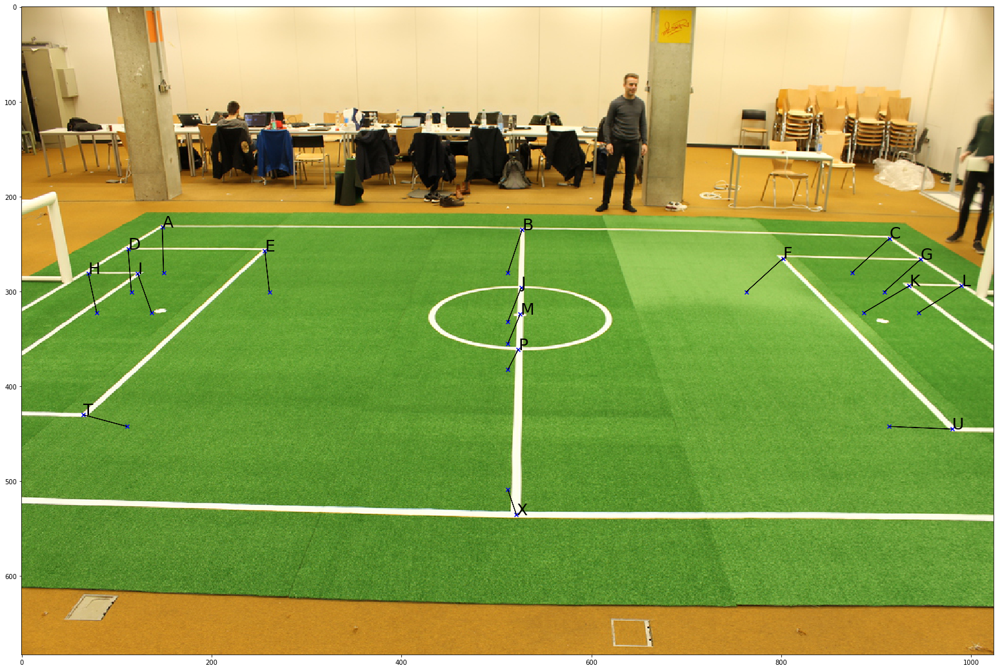

In [8]:
# Show first calibration image with annotation and points projected according to model and initial guess
# This should look qualitatively correct, and the difference between annotation and projection should look
# like it could be resolved by moving and zooming.
fname = 'calib-001.jpg'
data = pointsAsArray(calibrationData[fname])
prediction = modelFSingleImage(data[:,2:5], xStatInitialGuess, xDynInitialGuess)
showImageAnnotation (fname, calibrationData[fname], prediction = prediction)

In [9]:
# TODO: Implement
# This computes the residual vector for the least-square problem of calibrating
# both the static and dynamic parameters from a single image. residualForSingleImageWrapper
# is later called from least_squares
def residualForSingleImage (dataForOneImage, xStat, xDyn):
    """Returns a flattened residual vector for one image. dataForOneImage is dataset[filename],
    xStat are the statical parameters, xDyn the dynamical for this image."""
    data = pointsAsArray(dataForOneImage)
    prediction = modelFSingleImage(data[:,2:5], xStat, xDyn)
    res_vec = ((prediction - data[:,0:2])/noiseImage).flatten()
    return res_vec

def residualForSingleImageWrapper (x, dataForOneImage):
    """This function is passed to least_squares and calls residualForSingleImage"""
    xStat = x[:dofXStat]
    xDyn = x[-dofXDyn:]
    return residualForSingleImage(dataForOneImage, xStat, xDyn)


In [10]:
# TODO: Implement
# This computes the residual vector for the least-square problem of calibrating
# both the static and dynamic parameters from multiple images. residualForMultiImagesWrapper
# is later called from least_squares
# Note that data is a dict mapping image name to the data for that image. To iterate through
# a dict you need to use data.values()
def residualForMultiImagesWrapper (x, data):
    """This function is passed to least_squares. It calls residualForSingleImage for every image in data
    and concatenates the resulting residuals. x is the vector of parameters containing one xStat for all images
    and onve xDyn for every image."""
    xStat=x[:dofXStat]
    residuals = np.array([residualForSingleImage(pointsMap, xStat, xDyn=x[dofXStat+dofXDyn*i: dofXDyn*(i+1)+dofXStat]) for i, pointsMap in enumerate(data.values())])
    residuals = np.asarray([residual for residual_array in residuals for residual in residual_array.flatten()])
    return residuals

In [11]:
noiseImage = 1 #  Generically set to 1 since error is the same in every picture as discussed in the Q&A sessions

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         2.1670e+07                                    9.26e+06    
       1              3         3.3287e+06      1.83e+07       1.71e+03       5.39e+06    
       2              4         1.7326e+06      1.60e+06       3.43e+03       7.51e+06    
       3              6         6.9792e+04      1.66e+06       8.57e+02       9.38e+05    
       4              8         1.0490e+04      5.93e+04       4.28e+02       1.72e+04    
       5              9         3.6490e+03      6.84e+03       8.57e+02       3.64e+04    
       6             11         3.1943e+03      4.55e+02       4.28e+02       5.36e+04    
       7             13         2.9942e+03      2.00e+02       1.07e+02       1.01e+03    
       8             15         2.9815e+03      1.28e+01       5.35e+01       1.06e+02    
       9             18         2.9813e+03      1.17e-01       6.69e+00       3.57e+01    

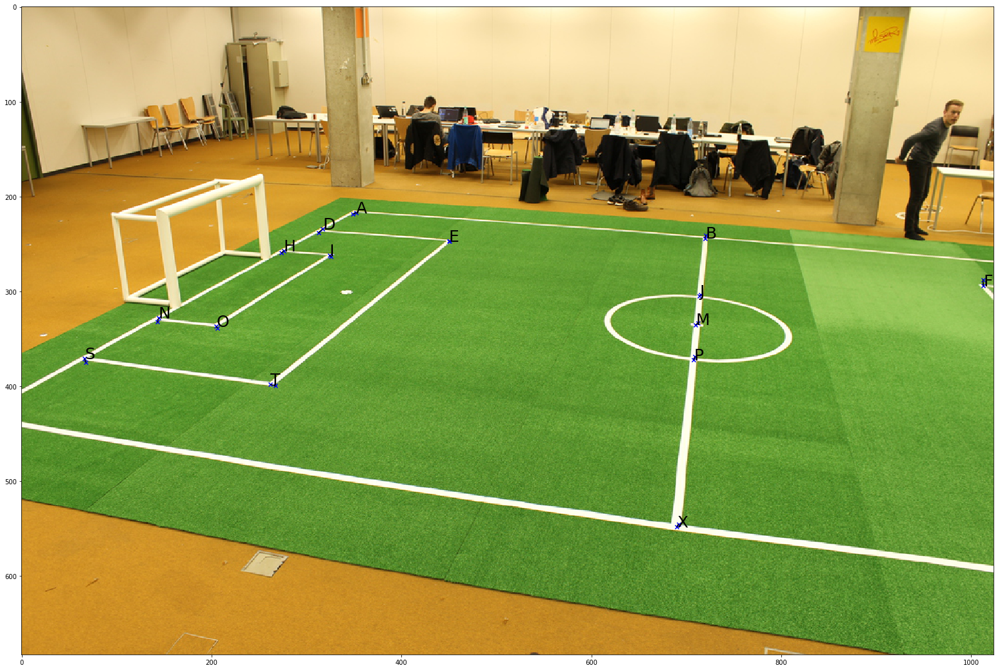

In [12]:
# Run the least square algorithm to fit the parameters
# It is important to set jac='3-point'. It did not work
# otherwise.
x = np.array(list(xStatInitialGuess) + len(calibrationData)*list(xDynInitialGuess))# change if you organized x differently
lsResult = least_squares (residualForMultiImagesWrapper, x, args=(calibrationData,), jac='3-point', verbose=2)
xHat = lsResult['x']
xStatHat = xHat [0:dofXStat] # we need the static parameters later
print (f"cost {lsResult['cost']} rms {costToRms(lsResult['cost'], nrOfCalibrationPoints, noiseImage)}px")
print(xHat[0:dofXStat])
print(parametrizeT0InField(xHat))

# Show prediction for an example image
fname = random.choice(list(calibrationData.keys()))
idx = indexOf(fname, calibrationData)
data = calibrationData[fname]
prediction = modelFSingleImage(pointsAsArray(data)[:,2:5], xHat[0:dofXStat], xHat[dofXStat+idx*dofXDyn:dofXStat + (idx+1)*dofXDyn])
showImageAnnotation (fname, data, prediction = prediction)

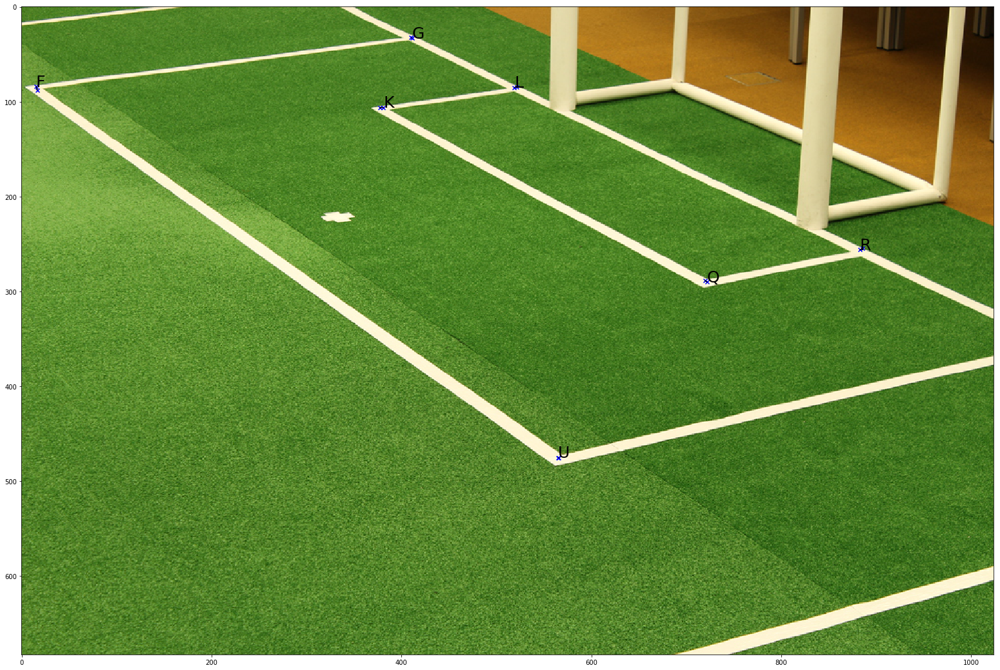

In [14]:
fname = random.choice(list(calibrationData.keys()))
idx = indexOf(fname, calibrationData)
data = calibrationData[fname]
prediction = modelFSingleImage(pointsAsArray(data)[:,2:5], xHat[0:dofXStat], xHat[dofXStat+idx*dofXDyn:dofXStat + (idx+1)*dofXDyn])
showImageAnnotation (fname, data, prediction = prediction)

In [15]:
# Model of a single image with ball, i.e. the model used after calibration is finished in the actual system
# pan, tilt, f, ballX, ballY
dofXDynWithBall = dofXDyn+2 # 2 for ball position
xDynWithBallInitialGuess = np.array([900, 0,-0.3,0,0])

def modelFSingleImageWithBall (pField, xStat, xDyn, ballIdx):
    """Maps all points of a single image from 3d field coordinates to image coordinates, given the parameters xStat and xDyn that describe the camera. xStat contains all parameters that do
    are fixed during camera operation, xDyn contains all parameters that change. pField's and the result's
    first dimension is the multitude of points. pField[ballIdx] is the ball which does not have a known
    x / y position only a know z position."""
    pField
    pField[ballIdx][0] = xDyn[dofXDyn]
    pField[ballIdx][1] = xDyn[dofXDyn+1] # [2] is already correctly set
    result = np.array([modelFSinglePoint(pFieldEntry, xStat, xDyn) for pFieldEntry in pField])
    return result

def residualForSingleImageWithBall (dataForOneImage, xStat, xDyn):
    """Returns a flattened residual vector for one image with ball. dataForOneImage is dataset[filename],
    xStat are the statical parameters, xDyn the dynamical for this image."""
    ballIdx = indexOf ('Ball', dataForOneImage)
    dataAsArray = pointsAsArray(dataForOneImage)
    return ((modelFSingleImageWithBall(dataAsArray[:,2:5], xStat, xDyn, ballIdx) - dataAsArray[:,0:2])/noiseImage).flatten()

def modelFSingleImageWithBallData (dataForOneImage, xStat, xDyn):
    """Returns all points for one image with ball. dataForOneImage is dataset[filename],
    xStat are the statical parameters, xDyn the dynamical for this image. """
    ballIdx = indexOf('Ball', dataForOneImage)
    dataAsArray = pointsAsArray(dataForOneImage)
    return modelFSingleImageWithBall(dataAsArray[:,2:5], xStat, xDyn, ballIdx)

def residualForSingleImageWithBallWrapper (xDyn, dataForOneImage, xStat):
    """This function is passed to least_squares and calls residualForSingleImageWithBall"""
    return residualForSingleImageWithBall (dataForOneImage, xStat, xDyn)

#  Extrinsic calibration and drawing of a free-kick circle <a id="freekick"></a>

In [16]:
# TODO: Implement
# Make the freistoss circle
def makeCircle (xStat, xDynWithBall, radius=0.75):
    """Makes a circle around the ball with a given radius, projects it into the image and 
       returns the result as a sequence of 2d-points"""
    ballX = xDynWithBall[-2]
    ballY = xDynWithBall[-1]
    
    num_samples = 100
    theta = np.linspace(0, 2*np.pi, num_samples)

    x = radius * np.cos(theta) + ballX
    y = radius * np.sin(theta) + ballY
    z = np.zeros(num_samples)
    print(f"ballX: {ballX}, ballY: {ballY}")
    pointsOnCircle = [[x,y,z] for x,y,z in zip(x,y,z)]
    pointsInImage = modelFSingleImage(pointsOnCircle, xStat, xDynWithBall)
    ballInImage = modelFSinglePoint([ballX,ballY,0.05], xStat, xDynWithBall)
    # Kreispunkte in Bildkoordinaten umrechnen
    print(ballInImage)

    return pointsInImage

freistoss-044.jpg
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         3.7445e+04                                    7.54e+05    
       1              2         3.2849e+02      3.71e+04       4.62e+01       3.58e+04    
       2              3         1.4530e+02      1.83e+02       9.14e-01       8.80e+01    
       3              4         1.4529e+02      4.39e-03       2.55e-03       1.75e-02    
       4              5         1.4529e+02      1.27e-11       1.64e-08       6.44e-06    
Both `ftol` and `xtol` termination conditions are satisfied.
Function evaluations 5, initial cost 3.7445e+04, final cost 1.4529e+02, first-order optimality 6.44e-06.
cost 145.29293812040487 rms 4.017917344988084 px
[ 8.52925150e+02  7.07550887e-03 -3.51316123e-01 -1.52349003e+00
  3.40135177e-01]
ballX: -1.5234900259931345, ballY: 0.34013517746868194
(339.0, 325.0)


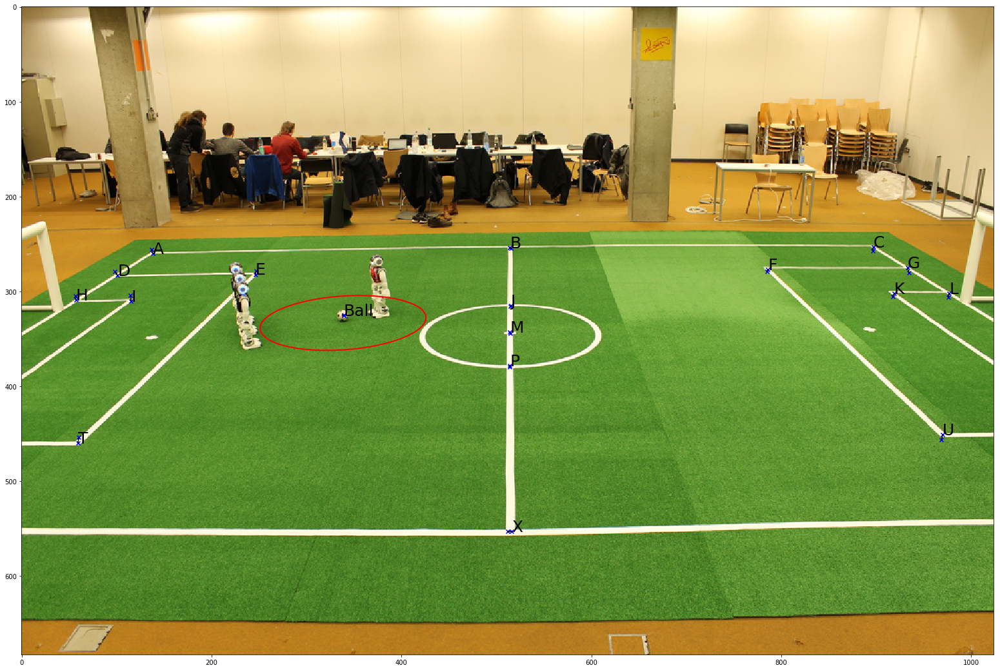

In [44]:
fname = random.choice(list(freistossData.keys()))
print(fname)
data = freistossData[fname]

if("Ball" in data.keys()):
    """
    Since there are some images where no ball is present this is used to prevent the algorithm from running into
    key-errors due to the lack of a ball in the image.
    """
    lsResult = least_squares (residualForSingleImageWithBallWrapper, xDynWithBallInitialGuess, args=(data, xStatHat), jac='3-point', verbose=2)
    xDynWithBallHat = lsResult['x']
    print(f"cost {lsResult['cost']} rms {costToRms(lsResult['cost'], len(data), noiseImage)} px")
    print(xDynWithBallHat)
    prediction = modelFSingleImageWithBallData (data, xStatHat, xDynWithBallHat)
    circle = makeCircle (xStatHat, xDynWithBallHat)
    showImageAnnotation (fname, freistossData[fname], prediction = prediction, circle = circle)
else:
    print("Hier ist wohl ein Kalibrierungsbild und kein Freistoßbild")

ballX: -1.5234900259931345, ballY: 0.34013517746868194
(339.0, 325.0)


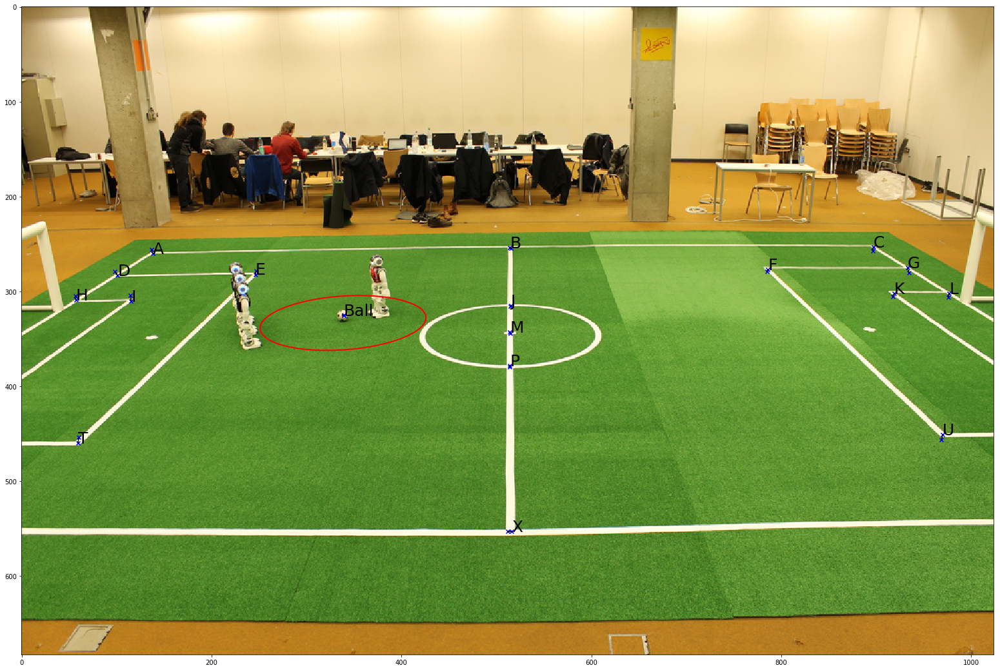

In [45]:
prediction = modelFSingleImageWithBallData (data, xStatHat, xDynWithBallHat)
circle = makeCircle (xStatHat, xDynWithBallHat)
showImageAnnotation (fname, freistossData[fname], prediction = prediction, circle = circle,
                    save='robocup-freistoss-result.jpg')

In [ ]:
# Use this to run the least-squares algorithm on all of the images of the "freistoß" dataset 
for fname in freistossData.keys():
    #fname = random.choice(list(freistossData.keys()))
    print(fname)
    data = freistossData[fname]

    if("Ball" not in data.keys()):
        """
        Since there are some images where no ball is present this is used to prevent the algorithm from running into
        key-errors due to the lack of a ball in the image.
        """
        print("Hier ist wohl ein Kalibrierungsbild und kein Freistoßbild")
        showImageAnnotation (fname, freistossData[fname], prediction = None, circle = None)
        continue
    lsResult = least_squares (residualForSingleImageWithBallWrapper, xDynWithBallInitialGuess, args=(data, xStatHat), jac='3-point', verbose=2)
    xDynWithBallHat = lsResult['x']
    print(f"cost {lsResult['cost']} rms {costToRms(lsResult['cost'], len(data), noiseImage)} px")
    print(xDynWithBallHat)
    prediction = modelFSingleImageWithBallData (data, xStatHat, xDynWithBallHat)
    circle = makeCircle (xStatHat, xDynWithBallHat)
    showImageAnnotation (fname, freistossData[fname], prediction = prediction, circle = circle)